In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
from shapely.geometry import Point
from sklearn.cluster import DBSCAN
import re
import requests
import os
import matplotlib.pyplot as plt

os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'

# Preview data & Prepare

In [2]:
df = pd.read_csv(r'..\..\data\clean_bkk_treasury.csv').drop('Unnamed: 0',axis = 1)
mooban_df = pd.read_csv(r'..\..\data\mooban_opendata.csv')

#Focus on กรุงเทพมหานคร

mooban_df = mooban_df[mooban_df['PROV_NAMT'] == 'กรุงเทพมหานคร']

In [3]:
mooban_df

,PRJ_ID,PRJ_NAMT,TAM_NAMT,TAM_CODE,AMP_NAMT,AMP_CODE,PROV_NAMT,PROV_CODE,SHAPE_YEAR,X,Y,LAT,LONG
0,16508371523257,ไอคอน ปิ่นเกล้า,ศาลาธรรมสพน์,2,ทวีวัฒนา,48,กรุงเทพมหานคร,10,2562,650980.6976,1.523224e+06,13.774488,100.396614
1,16455011522071,THE EXCLUSIVE ปิ่นเกล้า ทวีวัฒนา,ทวีวัฒนา,1,ทวีวัฒนา,48,กรุงเทพมหานคร,10,2562,645226.8812,1.522019e+06,13.763891,100.343338
2,16466581524860,เดอะ แกรนด์ ปิ่นเกล้า,ศาลาธรรมสพน์,2,ทวีวัฒนา,48,กรุงเทพมหานคร,10,2562,646457.1623,1.525343e+06,13.793871,100.354889
3,104802029,หมู่บ้านสุขทวีวิลเลจ,ศาลาธรรมสพน์,2,ทวีวัฒนา,48,กรุงเทพมหานคร,10,2562,645425.0979,1.525077e+06,13.791518,100.345329
4,16519741523251,เศรษฐสิริ,ศาลาธรรมสพน์,2,ทวีวัฒนา,48,กรุงเทพมหานคร,10,2562,652021.4953,1.523556e+06,13.777431,100.406258
...,...,...,...,...,...,...,...,...,...,...,...,...,...
777,16696421522179,NOBLE REVOLVE RATCHADA,ห้วยขวาง,1,ห้วยขวาง,17,กรุงเทพมหานคร,10,2562,669642.8162,1.522179e+06,13.764001,100.569138
778,16711601521212,ศุภาลัย ไพร์ม พระราม 9,บางกะปิ,2,ห้วยขวาง,17,กรุงเทพมหานคร,10,2562,671160.6678,1.521212e+06,13.755172,100.583115
779,16704721523299,THE EXCEL HIDEAWAY RATCHADA - HUAI KHWANG,ห้วยขวาง,1,ห้วยขวาง,17,กรุงเทพมหานคร,10,2562,670472.9002,1.523300e+06,13.774081,100.576881
780,16713501524610,ASHER RATCHADA - HUAI KHWANG,สามเสนนอก,4,ห้วยขวาง,17,กรุงเทพมหานคร,10,2562,671350.3283,1.524611e+06,13.785880,100.585075


In [4]:
def extract_land_no(text):
    '''extract land_no from text
    return land_no in string format
    if dont have land_no return null
    '''
    try:
        land_no_text = re.findall('[เลข].+' , text)[0]
        land_no = re.split(':[ ]*',land_no_text)[-1]
        return land_no
    except:
        pass

In [5]:
df['land_no'] = df['ROUTE_TITLE'].apply(lambda x : extract_land_no(x) )

In [6]:
#Check if convert success and not error
sum(df['land_no'].isnull() == True) == sum(df['ROUTE_TITLE'].isnull() == True)

True

In [7]:
# create geodataframe to use geospartial data properties

gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lgt, df.ltt) ,crs = 'EPSG:4326')
mooban_gdf = gpd.GeoDataFrame(mooban_df , geometry = gpd.points_from_xy(mooban_df.LONG, mooban_df.LAT),crs = 'EPSG:4326')

In [8]:
gdf

,district,subdistrict,price,ROUTE_TITLE,lgt,ltt,land_no,geometry
0,พระโขนง,คลองเตย,"95,000",ระวาง: 5136-III-6814-02 เลขที่โฉนด: 4858,100.557512,13.709283,4858,POINT (100.55751 13.70928)
1,คลองเตย,คลองเตย,"75,000",ระวาง: 5136-III-6814-03 เลขที่โฉนด: 2035,100.561328,13.709395,2035,POINT (100.56133 13.70939)
2,พระโขนง,คลองเตย,"115,000",ระวาง: 5136-III-6814-03 เลขที่โฉนด: 29260,100.563376,13.707530,29260,POINT (100.56338 13.70753)
3,พระโขนง,คลองเตย,"95,000",ระวาง: 5136-III-6814-03 เลขที่โฉนด: 4878,100.560443,13.709697,4878,POINT (100.56044 13.70970)
4,พระโขนง,คลองเตย,"75,000",ระวาง: 5136-III-6814-03 เลขที่โฉนด: 4879,100.561093,13.709934,4879,POINT (100.56109 13.70993)
...,...,...,...,...,...,...,...,...
1758864,ห้วยขวาง,สามเสนนอก,"60,000",ระวาง: 5136-IV-7224-13 เลขที่โฉนด: 799,100.589155,13.785030,799,POINT (100.58916 13.78503)
1758865,ห้วยขวาง,สามเสนนอก,"60,000",ระวาง: 5136-IV-7224-13 เลขที่โฉนด: 800,100.589211,13.785035,800,POINT (100.58921 13.78503)
1758866,ห้วยขวาง,สามเสนนอก,"60,000",ระวาง: 5136-IV-7224-13 เลขที่โฉนด: 801,100.589266,13.785040,801,POINT (100.58927 13.78504)
1758867,บางซื่อ,บางซื่อฝั่งใต้,"63,000",ระวาง: 5136-IV-7226-13 เลขที่โฉนด: 80977,100.588181,13.802195,80977,POINT (100.58818 13.80219)


In [9]:
mooban_gdf

,PRJ_ID,PRJ_NAMT,TAM_NAMT,TAM_CODE,AMP_NAMT,AMP_CODE,PROV_NAMT,PROV_CODE,SHAPE_YEAR,X,Y,LAT,LONG,geometry
0,16508371523257,ไอคอน ปิ่นเกล้า,ศาลาธรรมสพน์,2,ทวีวัฒนา,48,กรุงเทพมหานคร,10,2562,650980.6976,1.523224e+06,13.774488,100.396614,POINT (100.39661 13.77449)
1,16455011522071,THE EXCLUSIVE ปิ่นเกล้า ทวีวัฒนา,ทวีวัฒนา,1,ทวีวัฒนา,48,กรุงเทพมหานคร,10,2562,645226.8812,1.522019e+06,13.763891,100.343338,POINT (100.34334 13.76389)
2,16466581524860,เดอะ แกรนด์ ปิ่นเกล้า,ศาลาธรรมสพน์,2,ทวีวัฒนา,48,กรุงเทพมหานคร,10,2562,646457.1623,1.525343e+06,13.793871,100.354889,POINT (100.35489 13.79387)
3,104802029,หมู่บ้านสุขทวีวิลเลจ,ศาลาธรรมสพน์,2,ทวีวัฒนา,48,กรุงเทพมหานคร,10,2562,645425.0979,1.525077e+06,13.791518,100.345329,POINT (100.34533 13.79152)
4,16519741523251,เศรษฐสิริ,ศาลาธรรมสพน์,2,ทวีวัฒนา,48,กรุงเทพมหานคร,10,2562,652021.4953,1.523556e+06,13.777431,100.406258,POINT (100.40626 13.77743)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777,16696421522179,NOBLE REVOLVE RATCHADA,ห้วยขวาง,1,ห้วยขวาง,17,กรุงเทพมหานคร,10,2562,669642.8162,1.522179e+06,13.764001,100.569138,POINT (100.56914 13.76400)
778,16711601521212,ศุภาลัย ไพร์ม พระราม 9,บางกะปิ,2,ห้วยขวาง,17,กรุงเทพมหานคร,10,2562,671160.6678,1.521212e+06,13.755172,100.583115,POINT (100.58312 13.75517)
779,16704721523299,THE EXCEL HIDEAWAY RATCHADA - HUAI KHWANG,ห้วยขวาง,1,ห้วยขวาง,17,กรุงเทพมหานคร,10,2562,670472.9002,1.523300e+06,13.774081,100.576881,POINT (100.57688 13.77408)
780,16713501524610,ASHER RATCHADA - HUAI KHWANG,สามเสนนอก,4,ห้วยขวาง,17,กรุงเทพมหานคร,10,2562,671350.3283,1.524611e+06,13.785880,100.585075,POINT (100.58508 13.78588)


In [10]:
mooban_gdf.AMP_NAMT.value_counts()

คลองสามวา            53
จตุจักร              39
สายไหม               36
วัฒนา                34
บางขุนเทียน          33
ห้วยขวาง             32
บางเขน               31
หนองจอก              29
ลาดกระบัง            28
บางกะปิ              25
สะพานสูง             24
มีนบุรี              23
หนองแขม              22
คลองเตย              21
บางแค                20
บึงกุ่ม              20
สวนหลวง              19
คันนายาว             17
ดอนเมือง             17
ลาดพร้าว             16
ประเวศ               16
บางนา                15
ทุ่งครุ              15
ดินแดง               15
วังทองหลาง           14
ปทุมวัน              14
ราชเทวี              13
บางซื่อ              13
จอมทอง               11
บางพลัด              11
ทวีวัฒนา             10
ยานนาวา              10
พญาไท                10
สาทร                  9
บางรัก                9
ภาษีเจริญ             9
พระโขนง               9
คลองสาน               8
บางคอแหลม             7
บางบอน                6
ธนบุรี                4
ตลิ่งชัน        

In [11]:
# select the maximum value count amp to test

mooban_gdf[mooban_gdf['AMP_NAMT'] == 'คลองสามวา']

,PRJ_ID,PRJ_NAMT,TAM_NAMT,TAM_CODE,AMP_NAMT,AMP_CODE,PROV_NAMT,PROV_CODE,SHAPE_YEAR,X,Y,LAT,LONG,geometry
350,16935181537490,บ้านรัก ๙,สามวาตะวันออก,2,คลองสามวา,46,กรุงเทพมหานคร,10,2562,693744.6508,1.537519e+06,13.901116,100.793060,POINT (100.79306 13.90112)
351,16860151538517,พฤกษ์ลดา วงแหวน - หทัยราษฎร์,สามวาตะวันตก,1,คลองสามวา,46,กรุงเทพมหานคร,10,2562,685527.4430,1.538498e+06,13.910515,100.717102,POINT (100.71710 13.91052)
352,16853911534662,ศิรินรัตน์,สามวาตะวันตก,1,คลองสามวา,46,กรุงเทพมหานคร,10,2562,685384.3127,1.534551e+06,13.874849,100.715515,POINT (100.71551 13.87485)
353,16851971532764,LANCEO BY LALIN PROPERTY เฟส 1,บางชัน,3,คลองสามวา,46,กรุงเทพมหานคร,10,2562,685234.1009,1.532727e+06,13.858372,100.714005,POINT (100.71401 13.85837)
354,16849221532978,BURASIRI SERIES VERANDA,บางชัน,3,คลองสามวา,46,กรุงเทพมหานคร,10,2562,684920.7128,1.532954e+06,13.860441,100.711121,POINT (100.71112 13.86044)
355,16833881529885,CENTRO รามอินทรา 109,บางชัน,3,คลองสามวา,46,กรุงเทพมหานคร,10,2562,683380.9320,1.529921e+06,13.833129,100.696678,POINT (100.69668 13.83313)
356,16856441534722,พนาสนธิ์ ไพรเวทโฮม,สามวาตะวันตก,1,คลองสามวา,46,กรุงเทพมหานคร,10,2562,685604.9865,1.534485e+06,13.874240,100.717552,POINT (100.71755 13.87424)
357,16859801538182,HABITIA ORBIT,สามวาตะวันตก,1,คลองสามวา,46,กรุงเทพมหานคร,10,2562,685207.8898,1.538100e+06,13.906939,100.714119,POINT (100.71412 13.90694)
358,16862141533275,วิลล่า จามจุรี,บางชัน,3,คลองสามวา,46,กรุงเทพมหานคร,10,2562,686551.2228,1.533305e+06,13.863514,100.726227,POINT (100.72623 13.86351)
359,104603002,บ้านรื่นฤดี 5,บางชัน,3,คลองสามวา,46,กรุงเทพมหานคร,10,2562,686455.7300,1.532594e+06,13.857097,100.725296,POINT (100.72530 13.85710)


In [12]:
import folium
def get_google_sattelite_layer():
    '''This function return non-ovelay google satelite folium tilelayer 
    use to minimize creating tile layer code
    '''
    return folium.TileLayer(
            tiles = 'http://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}',
            attr = 'Google',
            name = 'Google Satellite',
            overlay = False,
            show = False)

In [13]:
# prescreen map area from candidate house estate in คลองสามวา

search_map = folium.Map(location = [13.910515,100.717102] , zoom_start = 18, tile = 'openstreetmap')
get_google_sattelite_layer().add_to(search_map)
folium.LayerControl().add_to(search_map)
for _,r in mooban_gdf[mooban_gdf['AMP_NAMT'] == 'คลองสามวา'].iterrows():
    
    iframe = folium.IFrame('<b>LAT</b>: ' + str(r['LAT'])
                            + '<br>' +'<b>LONG</b>: ' + str(r['LONG']) 
                            + '<br>' + '<b>ชื่อ</b>: ' + str(r['PRJ_NAMT']))

    popup = folium.Popup(iframe, min_width=300, max_width=300)
    
    folium.Marker(location = [r['LAT'],r['LONG']]
                 ,popup=popup).add_to(search_map)
search_map

In [14]:
# define lat long and searching area
lat , long = [13.898331,100.709872]
# area about 0.7 km diameter from lat , long
search_area = Point(long,lat).buffer(0.006,cap_style = 3)

In [15]:
#preview area
search_map = folium.Map(location = [lat,long] , zoom_start = 15, tile = 'openstreetmap')
get_google_sattelite_layer().add_to(search_map)
folium.GeoJson(search_area).add_to(search_map)
folium.LayerControl().add_to(search_map)
search_map

In [16]:
#query data only in search area

mooban_gdf_in_area = mooban_gdf[mooban_gdf.geometry.within(search_area)]
gdf_in_area = gdf[gdf.geometry.within(search_area)]

In [17]:
for _,r in mooban_gdf_in_area.iterrows():
    
    iframe = folium.IFrame('<b>LAT</b>: ' + str(r['LAT'])
                            + '<br>' +'<b>LONG</b>: ' + str(r['LONG']) 
                            + '<br>' + '<b>ชื่อ</b>: ' + str(r['PRJ_NAMT']))

    popup = folium.Popup(iframe, min_width=300, max_width=300)
    
    folium.Marker(location = [r['LAT'],r['LONG']]
                 ,popup=popup).add_to(search_map)

In [18]:
search_map

In [19]:
gdf_in_area

,district,subdistrict,price,ROUTE_TITLE,lgt,ltt,land_no,geometry
101567,คลองสามวา,สามวาตะวันตก,"18,000",ระวาง: 5136-IV-8436-02 เลขที่โฉนด: 79374,100.707086,13.904319,79374,POINT (100.70709 13.90432)
102053,คลองสามวา,สามวาตะวันตก,"3,000",ระวาง: 5136-IV-8436-05 เลขที่โฉนด: 65761,100.704283,13.902458,65761,POINT (100.70428 13.90246)
102062,คลองสามวา,สามวาตะวันตก,"2,300",ระวาง: 5136-IV-8436-05 เลขที่โฉนด: 71543,100.704259,13.901952,71543,POINT (100.70426 13.90195)
102063,คลองสามวา,สามวาตะวันตก,"2,300",ระวาง: 5136-IV-8436-05 เลขที่โฉนด: 71544,100.703985,13.902241,71544,POINT (100.70398 13.90224)
102089,คลองสามวา,สามวาตะวันตก,"25,000",ระวาง: 5136-IV-8436-06 เลขที่โฉนด: 103583,100.705661,13.899888,103583,POINT (100.70566 13.89989)
...,...,...,...,...,...,...,...,...
105536,คลองสามวา,สามวาตะวันตก,"5,000",ระวาง: 5136-IV-8436-16 เลขที่โฉนด: 85790,100.715530,13.893638,85790,POINT (100.71553 13.89364)
105537,คลองสามวา,สามวาตะวันตก,"5,000",ระวาง: 5136-IV-8436-16 เลขที่โฉนด: 90088,100.714035,13.893557,90088,POINT (100.71404 13.89356)
105538,คลองสามวา,สามวาตะวันตก,"5,000",ระวาง: 5136-IV-8436-16 เลขที่โฉนด: 90089,100.714037,13.892379,90089,POINT (100.71404 13.89238)
105548,คลองสามวา,สามวาตะวันตก,"7,000",ระวาง: 5136-IV-8436-16 เลขที่โฉนด: 98094,100.715490,13.894780,98094,POINT (100.71549 13.89478)


### has too many landscape point , need to screen some point out

# Use Model to classify and screen data

In [20]:
import torchvision
from transformers import ViTImageProcessor, ViTForImageClassification ,ViTFeatureExtractor
from PIL import Image,ImageOps
from torchvision import transforms
import requests
from salem import  DataLevels, GoogleVisibleMap, Map

In [21]:
def imshow(img, text=None):
    
    '''imshow from torch tensor'''
    
    npimg = img.numpy()
    plt.axis("off")
    if text:
        plt.text(75, 8, text, style='italic',fontweight='bold',
            bbox={'facecolor':'white', 'alpha':0.8, 'pad':10})
        
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()    

In [22]:
def get_img_salem(location ,r=0.0003,maptype='satellite',crop = 0):
    '''This function return image in PIL format
    Bring API from Salem module
    location = [latitude,longtitude]
    size = image size
    r = width and hieght of picture if r less than 0.0004 , no different
    '''
    
    pic_lat,pic_long = location
    pic_map = GoogleVisibleMap(x=[pic_long-r, pic_long+r], y=[pic_lat-r, pic_lat + r], maptype=maptype)
    
    # Create a salem image data
    img = pic_map.get_vardata()

    #convert to PIL and transform image 

    im = Image.fromarray((img * 256).astype(np.uint8))
    im = im.convert("RGB")
    
    border = (crop, crop, crop, crop) # left, top, right, bottom
    im = ImageOps.crop(im, border)
    return im


In [23]:
from transformers import pipeline

checkpoint = "openai/clip-vit-large-patch14"
detector = pipeline(model=checkpoint, task="zero-shot-image-classification")

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


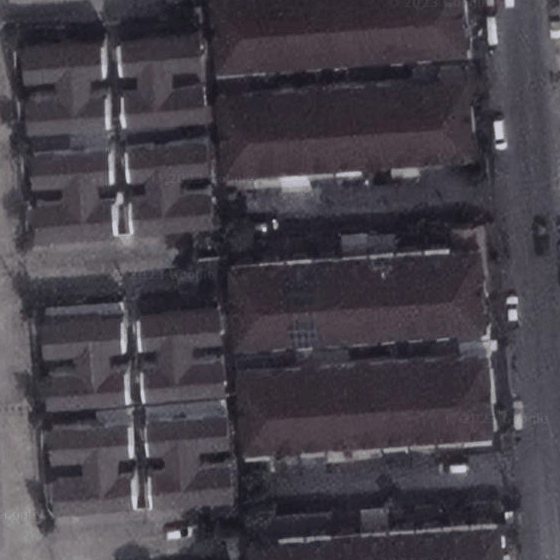

In [24]:
from PIL import Image
import requests

im = get_img_salem([lat,long],crop = 40)
im

In [25]:
from tqdm import tqdm


In [26]:
label_list = []
housing_prob_list = []

  2%|█▍                                                                              | 49/2798 [00:37<34:56,  1.31it/s]

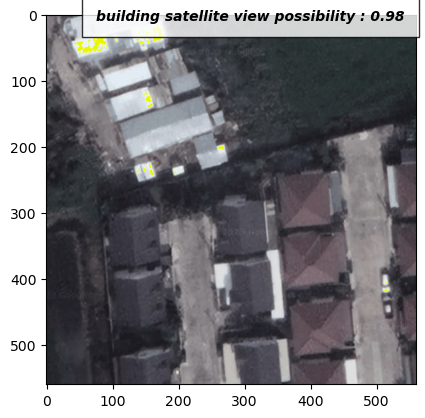

  4%|██▊                                                                             | 99/2798 [01:17<34:23,  1.31it/s]

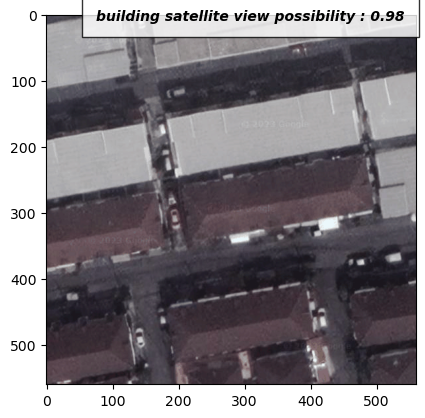

  5%|████▏                                                                          | 149/2798 [01:56<35:53,  1.23it/s]

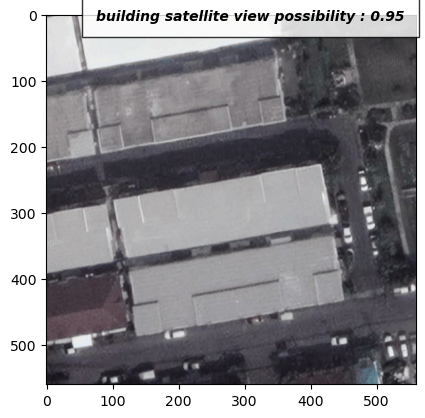

  7%|█████▌                                                                         | 199/2798 [02:34<32:59,  1.31it/s]

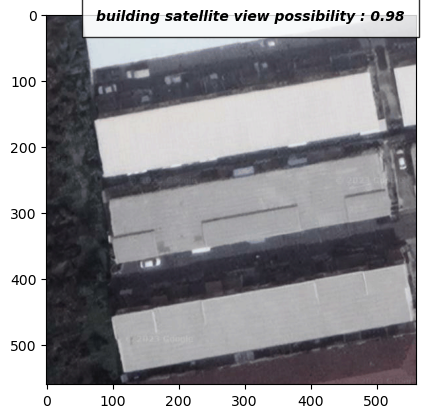

  9%|███████                                                                        | 249/2798 [03:12<32:13,  1.32it/s]

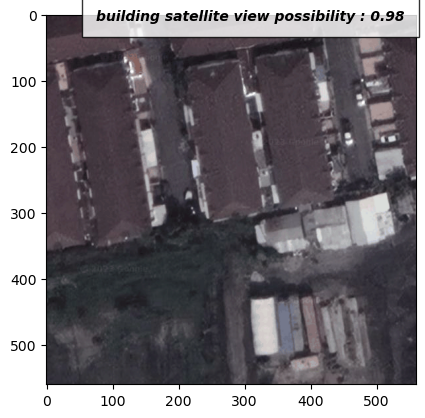

 11%|████████▍                                                                      | 299/2798 [03:51<32:44,  1.27it/s]

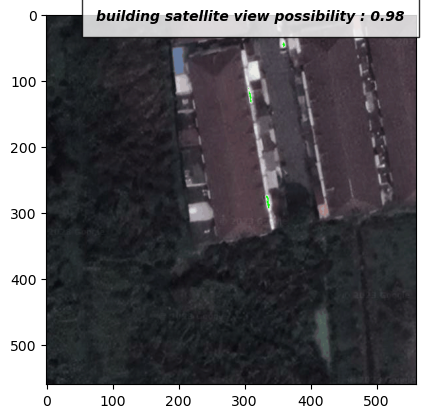

 12%|█████████▊                                                                     | 349/2798 [04:30<32:11,  1.27it/s]

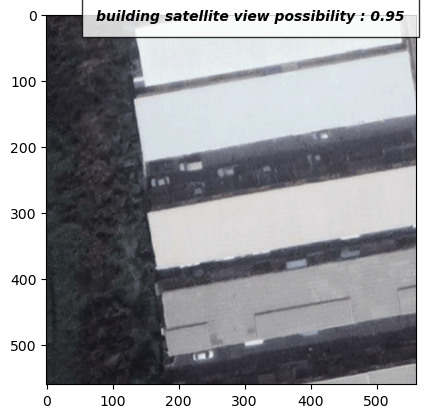

 14%|███████████▎                                                                   | 399/2798 [05:08<31:10,  1.28it/s]

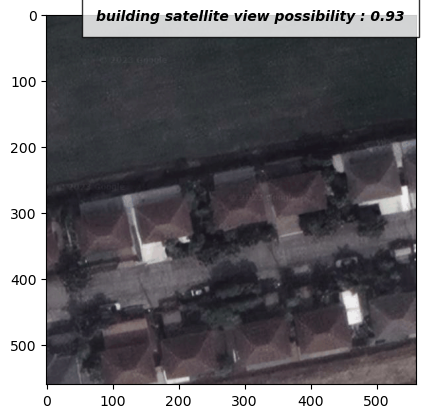

 16%|████████████▋                                                                  | 449/2798 [05:46<30:34,  1.28it/s]

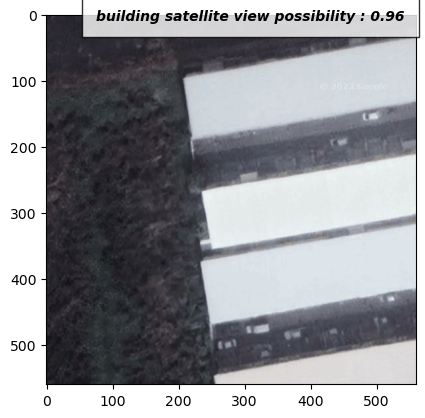

 18%|██████████████                                                                 | 499/2798 [06:25<28:51,  1.33it/s]

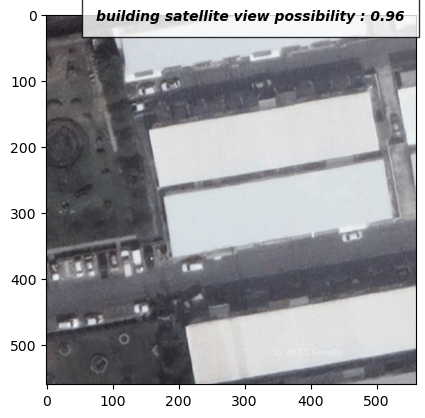

 20%|███████████████▌                                                               | 549/2798 [07:03<27:28,  1.36it/s]

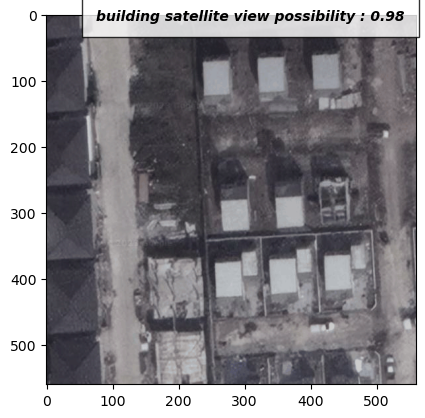

 21%|████████████████▉                                                              | 599/2798 [07:44<31:23,  1.17it/s]

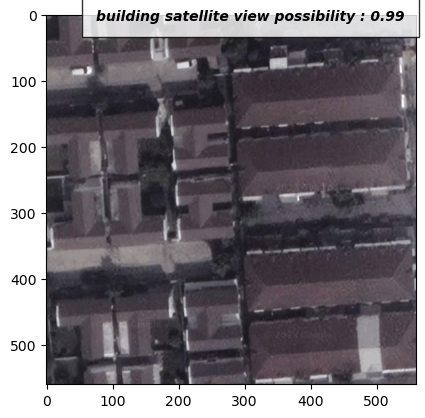

 23%|██████████████████▎                                                            | 649/2798 [08:23<29:49,  1.20it/s]

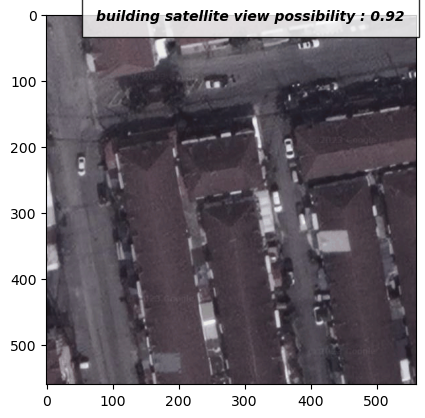

 25%|███████████████████▋                                                           | 699/2798 [09:06<31:59,  1.09it/s]

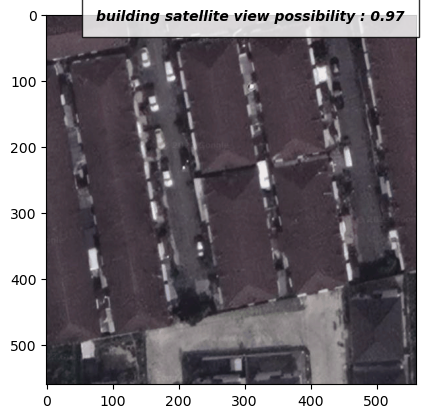

 27%|█████████████████████▏                                                         | 749/2798 [09:47<27:45,  1.23it/s]

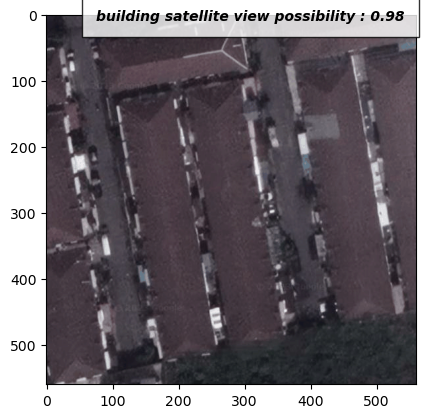

 29%|██████████████████████▌                                                        | 799/2798 [10:28<30:54,  1.08it/s]

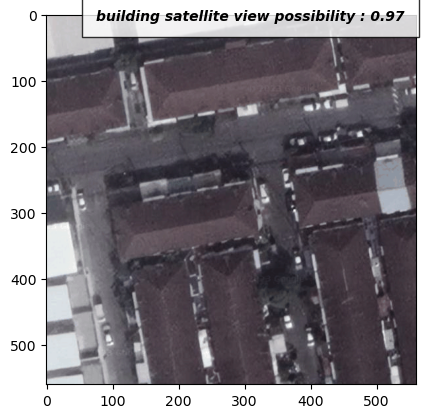

 30%|███████████████████████▉                                                       | 849/2798 [11:13<24:58,  1.30it/s]

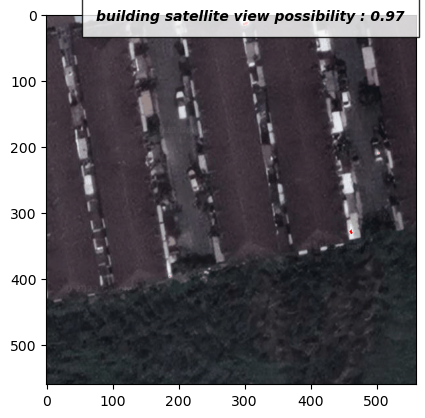

 32%|█████████████████████████▍                                                     | 899/2798 [11:57<28:11,  1.12it/s]

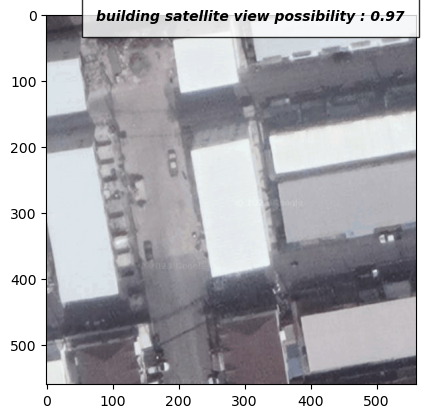

 34%|██████████████████████████▊                                                    | 949/2798 [12:43<27:42,  1.11it/s]

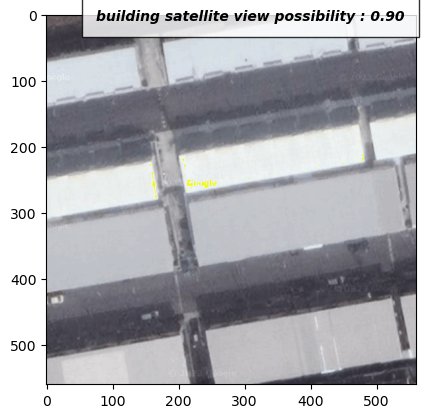

 36%|████████████████████████████▏                                                  | 999/2798 [13:25<23:50,  1.26it/s]

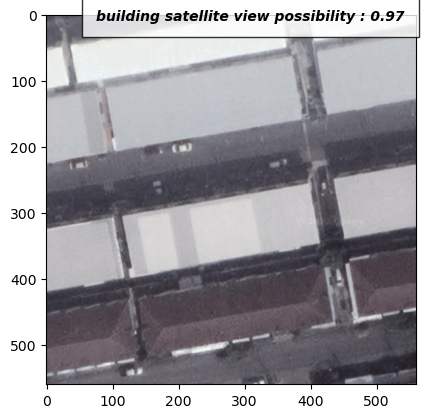

 37%|█████████████████████████████▏                                                | 1049/2798 [14:05<22:49,  1.28it/s]

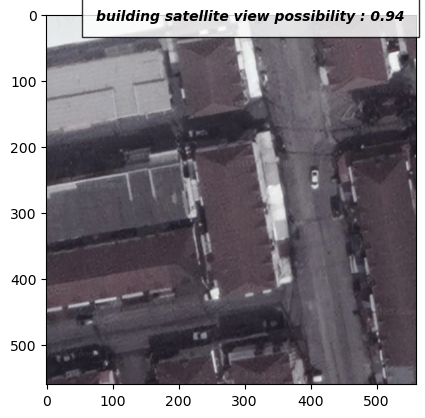

 39%|██████████████████████████████▋                                               | 1099/2798 [14:45<22:53,  1.24it/s]

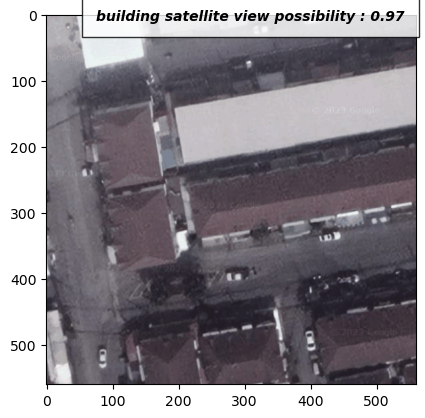

 41%|████████████████████████████████                                              | 1149/2798 [15:25<21:45,  1.26it/s]

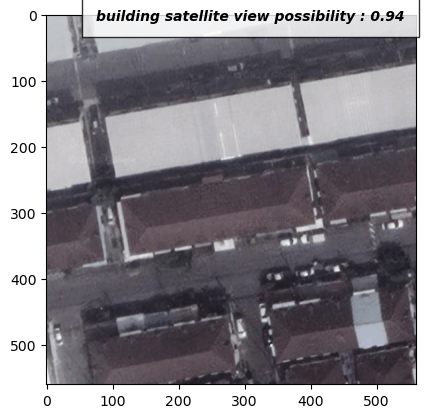

 43%|█████████████████████████████████▍                                            | 1199/2798 [16:04<21:20,  1.25it/s]

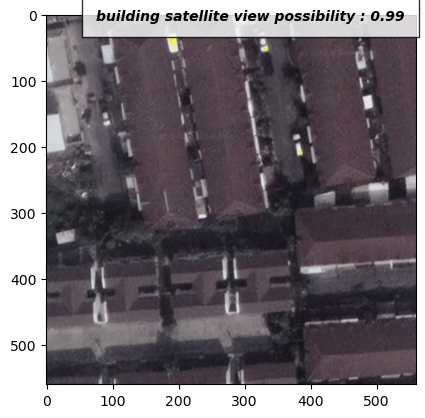

 45%|██████████████████████████████████▊                                           | 1249/2798 [16:44<20:55,  1.23it/s]

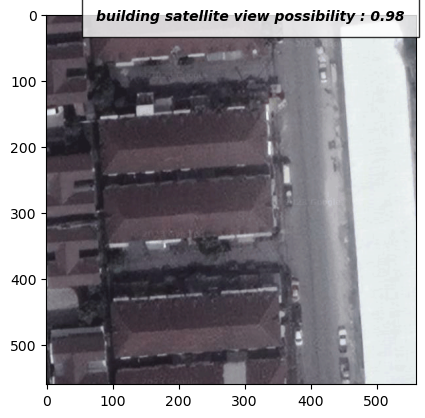

 46%|████████████████████████████████████▏                                         | 1299/2798 [17:23<18:58,  1.32it/s]

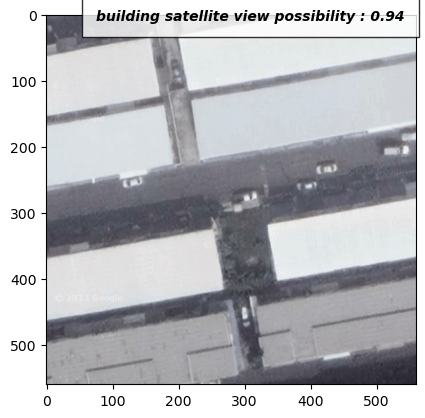

 48%|█████████████████████████████████████▌                                        | 1349/2798 [18:02<18:56,  1.28it/s]

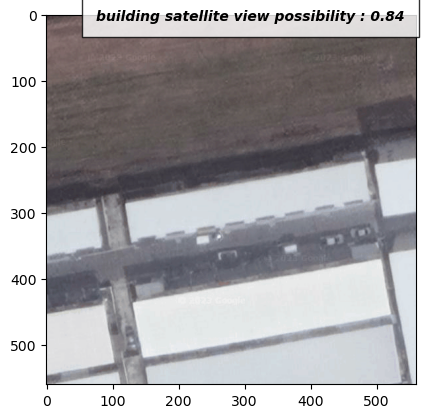

 50%|█████████████████████████████████████▌                                     | 1399/2798 [25:06<22:12:11, 57.13s/it]

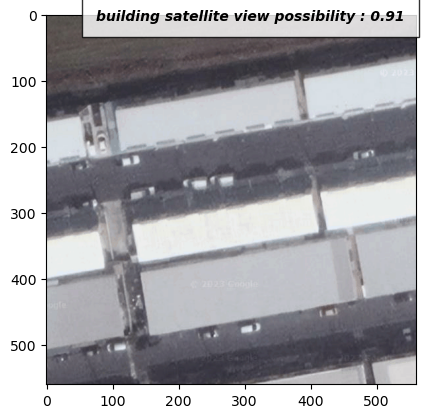

 52%|████████████████████████████████████████▍                                     | 1449/2798 [25:46<17:32,  1.28it/s]

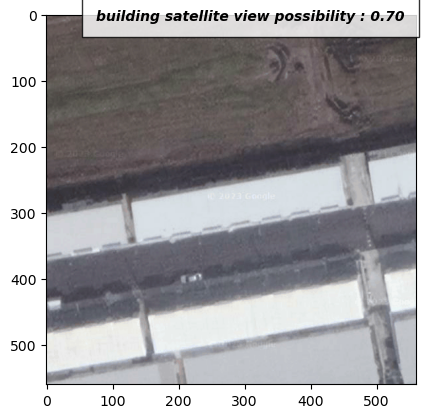

 54%|█████████████████████████████████████████▊                                    | 1499/2798 [26:25<16:43,  1.29it/s]

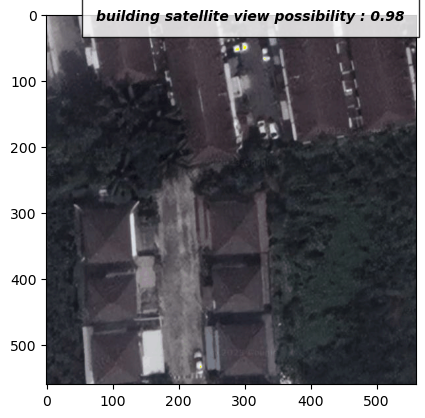

 55%|███████████████████████████████████████████▏                                  | 1549/2798 [27:06<17:02,  1.22it/s]

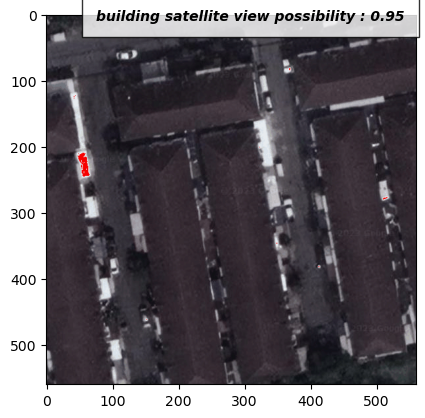

 57%|████████████████████████████████████████████▌                                 | 1599/2798 [27:46<16:12,  1.23it/s]

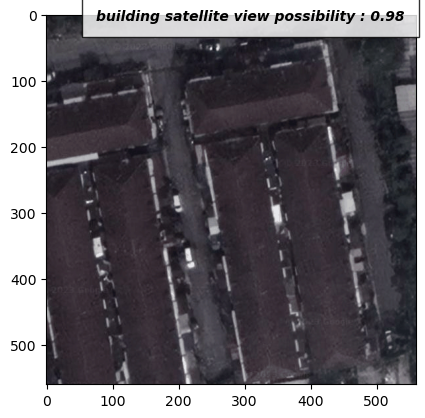

 59%|█████████████████████████████████████████████▉                                | 1649/2798 [28:26<15:00,  1.28it/s]

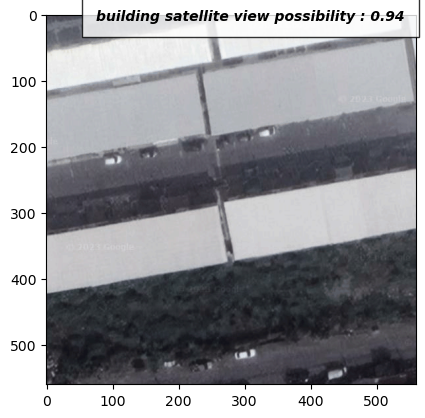

 61%|███████████████████████████████████████████████▎                              | 1699/2798 [29:07<15:17,  1.20it/s]

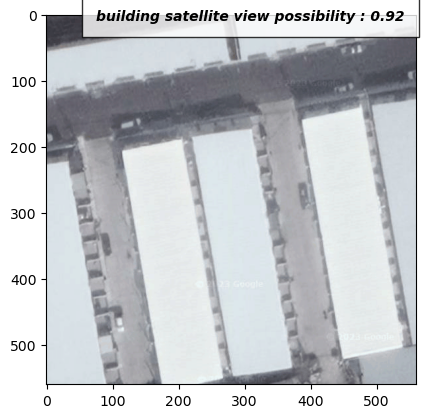

 63%|████████████████████████████████████████████████▊                             | 1749/2798 [29:49<14:39,  1.19it/s]

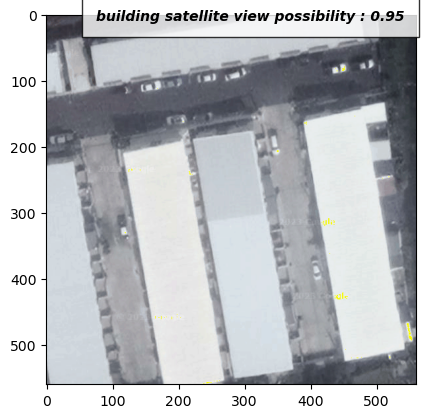

 64%|██████████████████████████████████████████████████▏                           | 1799/2798 [30:31<12:42,  1.31it/s]

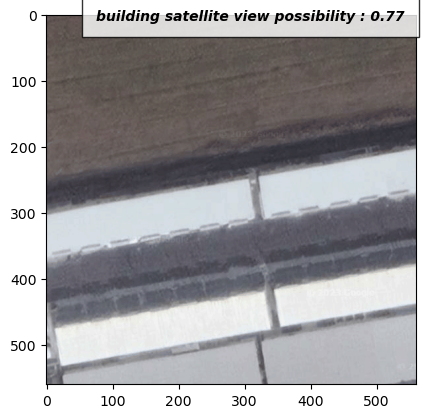

 66%|███████████████████████████████████████████████████▌                          | 1849/2798 [31:10<12:33,  1.26it/s]

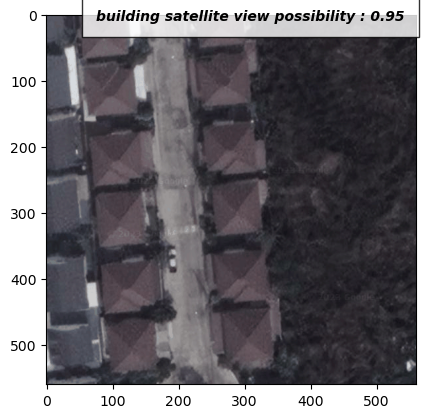

 68%|████████████████████████████████████████████████████▉                         | 1899/2798 [31:48<11:46,  1.27it/s]

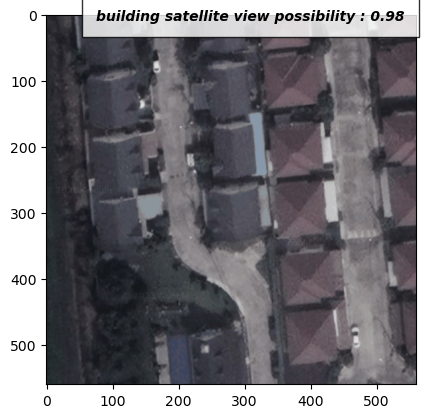

 70%|██████████████████████████████████████████████████████▎                       | 1949/2798 [32:27<10:47,  1.31it/s]

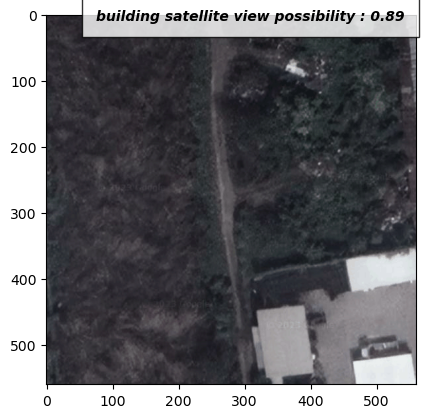

 71%|███████████████████████████████████████████████████████▋                      | 1999/2798 [33:05<10:20,  1.29it/s]

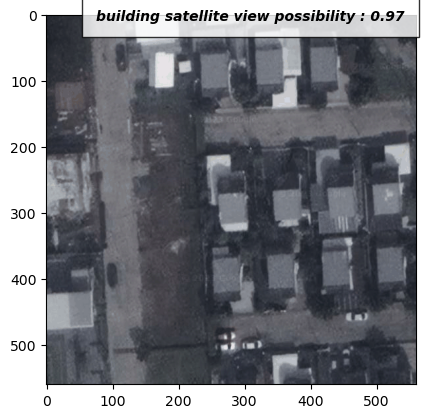

 73%|█████████████████████████████████████████████████████████                     | 2049/2798 [33:44<09:52,  1.26it/s]

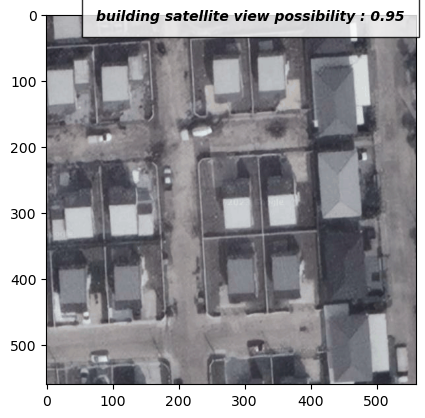

 75%|██████████████████████████████████████████████████████████▌                   | 2099/2798 [34:23<09:07,  1.28it/s]

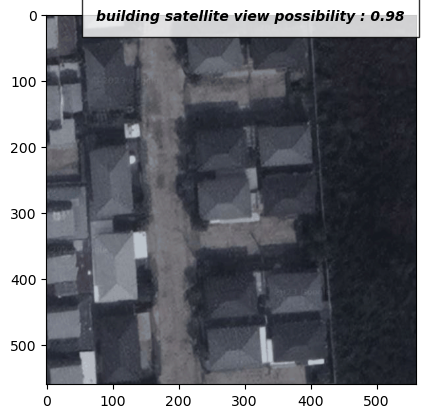

 77%|███████████████████████████████████████████████████████████▉                  | 2149/2798 [35:01<08:16,  1.31it/s]

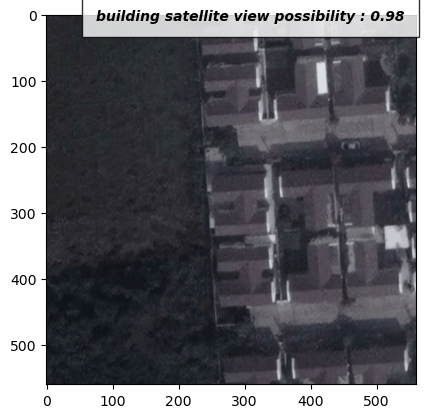

 79%|█████████████████████████████████████████████████████████████▎                | 2199/2798 [35:40<07:33,  1.32it/s]

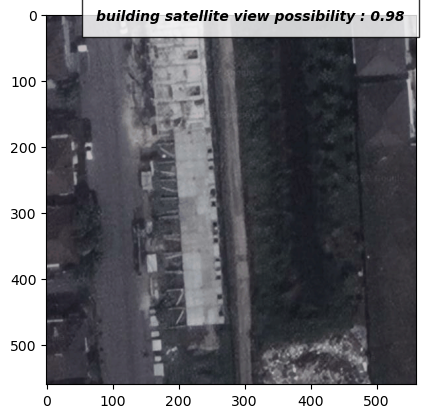

 80%|██████████████████████████████████████████████████████████████▋               | 2249/2798 [36:20<07:44,  1.18it/s]

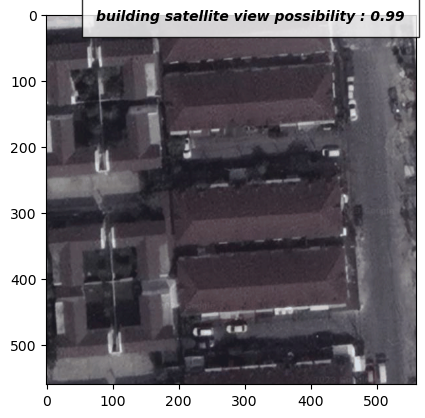

 82%|████████████████████████████████████████████████████████████████              | 2299/2798 [37:01<06:54,  1.20it/s]

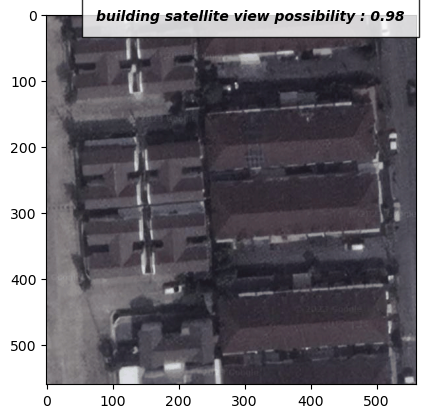

 84%|█████████████████████████████████████████████████████████████████▍            | 2349/2798 [37:42<06:04,  1.23it/s]

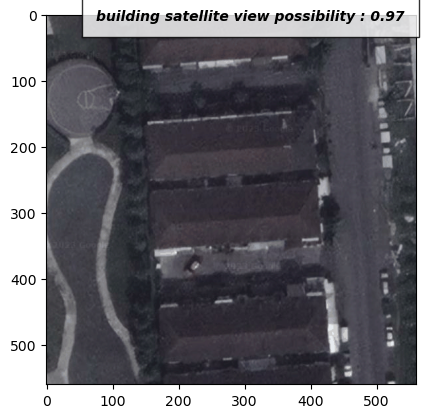

 86%|██████████████████████████████████████████████████████████████████▉           | 2399/2798 [38:22<05:22,  1.24it/s]

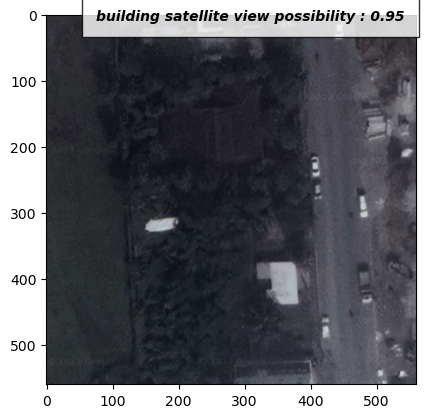

 88%|████████████████████████████████████████████████████████████████████▎         | 2449/2798 [39:02<04:47,  1.22it/s]

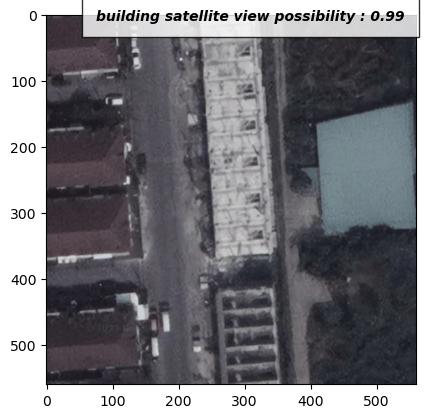

 89%|█████████████████████████████████████████████████████████████████████▋        | 2499/2798 [39:42<03:57,  1.26it/s]

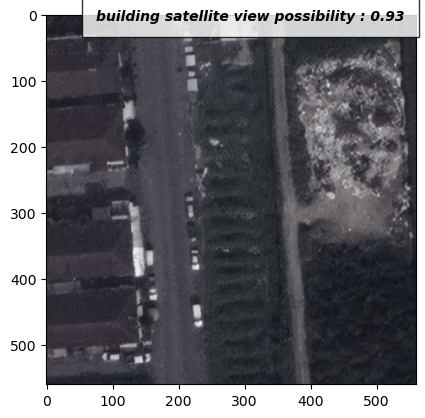

 91%|███████████████████████████████████████████████████████████████████████       | 2549/2798 [40:22<03:20,  1.24it/s]

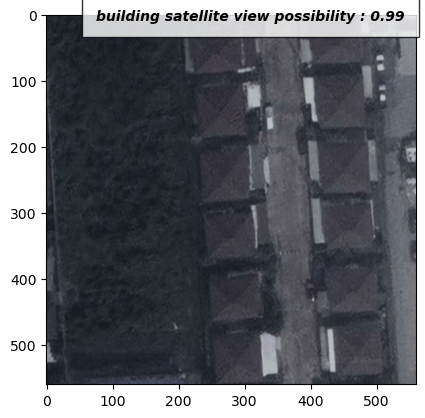

 93%|████████████████████████████████████████████████████████████████████████▍     | 2599/2798 [41:02<02:41,  1.23it/s]

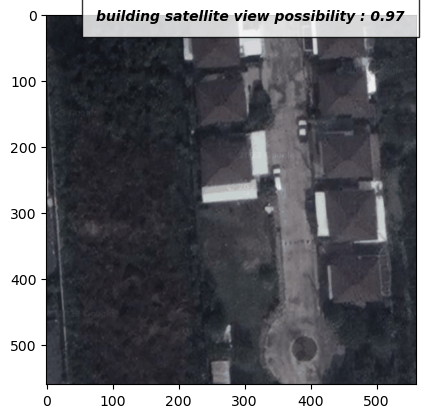

 95%|█████████████████████████████████████████████████████████████████████████▊    | 2649/2798 [41:43<02:02,  1.22it/s]

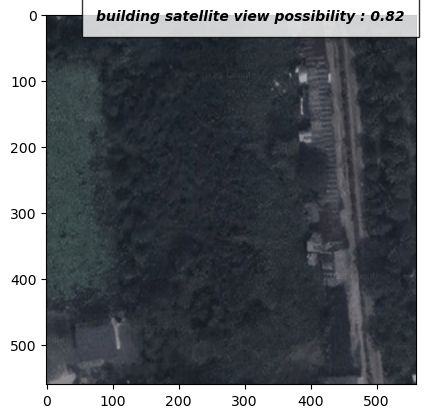

 96%|███████████████████████████████████████████████████████████████████████████▏  | 2699/2798 [42:24<01:24,  1.17it/s]

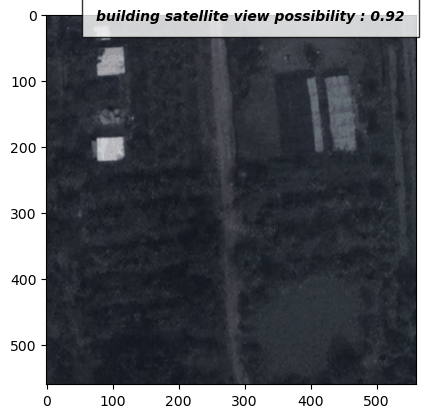

 98%|████████████████████████████████████████████████████████████████████████████▋ | 2749/2798 [43:04<00:40,  1.21it/s]

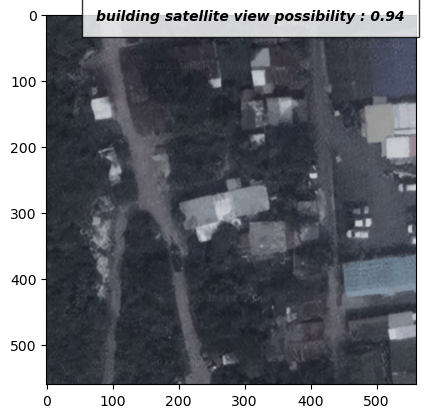

100%|██████████████████████████████████████████████████████████████████████████████| 2798/2798 [43:45<00:00,  1.07it/s]


In [27]:
for i in tqdm(range(len(gdf_in_area))):
    pic = get_img_salem([gdf_in_area.iloc[i]['ltt'],gdf_in_area.iloc[i]['lgt']],crop = 40)
    predictions = detector(pic, candidate_labels=["building satellite view", "ground satellite view"])
    label = predictions[0]['label']
    possibility  = predictions[0]['score']
    #Plot every 50
    if (i+1) % 50 == 0:
        plt.imshow(pic)
        plt.text(75, 8, label + ' possibility : ' + "%.2f" % possibility , style='italic',fontweight='bold',
                bbox={'facecolor':'white', 'alpha':0.8, 'pad':10})
        plt.show()
        
    label_list.append(label) 
    
    if label == 'building satellite view':
        housing_prob_list.append(possibility)
    else:
        housing_prob_list.append(1-possibility)
    

In [28]:
gdf_in_area['type'] = label_list
gdf_in_area['house_probability'] = housing_prob_list

C:\Users\kittisak\anaconda3\lib\site-packages\geopandas\geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\kittisak\anaconda3\lib\site-packages\geopandas\geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [29]:
gdf_in_area

,district,subdistrict,price,ROUTE_TITLE,lgt,ltt,land_no,geometry,type,house_probability
101567,คลองสามวา,สามวาตะวันตก,"18,000",ระวาง: 5136-IV-8436-02 เลขที่โฉนด: 79374,100.707086,13.904319,79374,POINT (100.70709 13.90432),building satellite view,0.871461
102053,คลองสามวา,สามวาตะวันตก,"3,000",ระวาง: 5136-IV-8436-05 เลขที่โฉนด: 65761,100.704283,13.902458,65761,POINT (100.70428 13.90246),building satellite view,0.757909
102062,คลองสามวา,สามวาตะวันตก,"2,300",ระวาง: 5136-IV-8436-05 เลขที่โฉนด: 71543,100.704259,13.901952,71543,POINT (100.70426 13.90195),ground satellite view,0.359601
102063,คลองสามวา,สามวาตะวันตก,"2,300",ระวาง: 5136-IV-8436-05 เลขที่โฉนด: 71544,100.703985,13.902241,71544,POINT (100.70398 13.90224),building satellite view,0.504332
102089,คลองสามวา,สามวาตะวันตก,"25,000",ระวาง: 5136-IV-8436-06 เลขที่โฉนด: 103583,100.705661,13.899888,103583,POINT (100.70566 13.89989),building satellite view,0.976923
...,...,...,...,...,...,...,...,...,...,...
105536,คลองสามวา,สามวาตะวันตก,"5,000",ระวาง: 5136-IV-8436-16 เลขที่โฉนด: 85790,100.715530,13.893638,85790,POINT (100.71553 13.89364),building satellite view,0.840612
105537,คลองสามวา,สามวาตะวันตก,"5,000",ระวาง: 5136-IV-8436-16 เลขที่โฉนด: 90088,100.714035,13.893557,90088,POINT (100.71404 13.89356),building satellite view,0.783803
105538,คลองสามวา,สามวาตะวันตก,"5,000",ระวาง: 5136-IV-8436-16 เลขที่โฉนด: 90089,100.714037,13.892379,90089,POINT (100.71404 13.89238),ground satellite view,0.400675
105548,คลองสามวา,สามวาตะวันตก,"7,000",ระวาง: 5136-IV-8436-16 เลขที่โฉนด: 98094,100.715490,13.894780,98094,POINT (100.71549 13.89478),building satellite view,0.823723


In [30]:
gdf_in_area['type'].value_counts()

building satellite view    2777
ground satellite view        21
Name: type, dtype: int64

In [31]:
#prepare and save in csv format
df_in_area = gdf_in_area.drop('geometry', axis=1)
df_in_area.to_csv(r'..\..\data\clean_bkk_treasury_test_area.csv')

In [32]:
#view ground area

ground_map = folium.Map(location = [lat,long] , zoom_start = 15, tile = 'openstreetmap')
get_google_sattelite_layer().add_to(ground_map)
folium.GeoJson(search_area).add_to(ground_map)
folium.LayerControl().add_to(ground_map)

for _,r in gdf_in_area[gdf_in_area['type'] == "ground satellite view"].iterrows():
    
    iframe = folium.IFrame('<b>LAT</b>: ' + str(r['lgt'])
                            + '<br>' +'<b>LONG</b>: ' + str(r['ltt']) 
                            + '<br>' + '<b>Prediction</b>: ' + str(r['type'])
                              + '<br>' + '<b>เลขโฉนด</b>: ' + str(r['land_no']))

    popup = folium.Popup(iframe, min_width=300, max_width=300)
    
    folium.Marker(location = [r['ltt'],r['lgt']]
                 ,popup=popup).add_to(ground_map)

ground_map